In [15]:
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow
import numpy as np

In [12]:
jetplane = cv2.imread('jetplane.tif')
walkbridge = cv2.imread('walkbridge.tif')


# In both images apply a filter to detect isolated points. To do this, look for a mask and use filter2D to apply the filter to the image. Plot the result and explain what happened to the image.

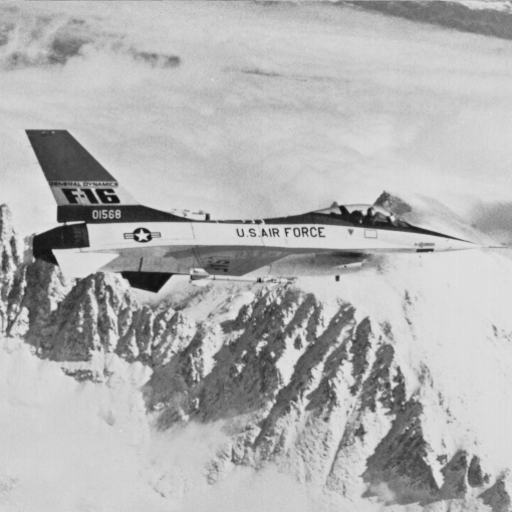

In [13]:
cv2_imshow(jetplane)

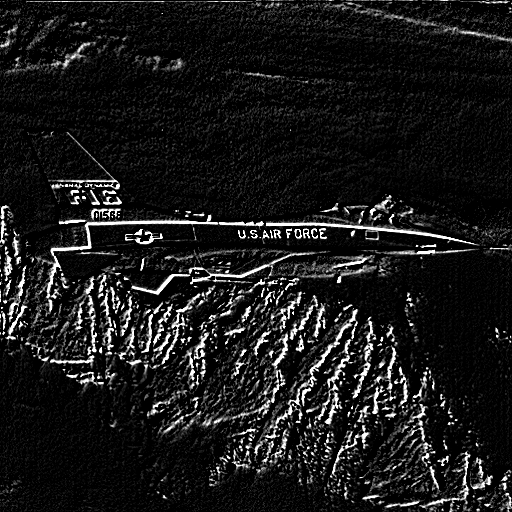

In [27]:
mascara = np.ones((3,3),np.float32)
mascara[0,0]=-8
res = cv2.filter2D(jetplane,-1,mascara)
cv2_imshow(res)


IN THE ABOVE CODE WE ARE USING A 2D FILTER IN THE IMAGE APPLYING A MASK, THIS MASK IS THE FILTER THAT WILL BE APPLIED TO THE IMAGE, IF WE CHANGE THE POSITION OF THE -8 VALUE IN MATRIX MASK WE CAN OBSERVE THAT THIS FILTER CHANGES THE POINT THAT CHANGES THE POINT MULTIPLIED BY 8, THIS TECHNIQUE IS VERY USED IN CONVULUCIONAL NEURAL NETWORKS FOR IMAGE DETECTION


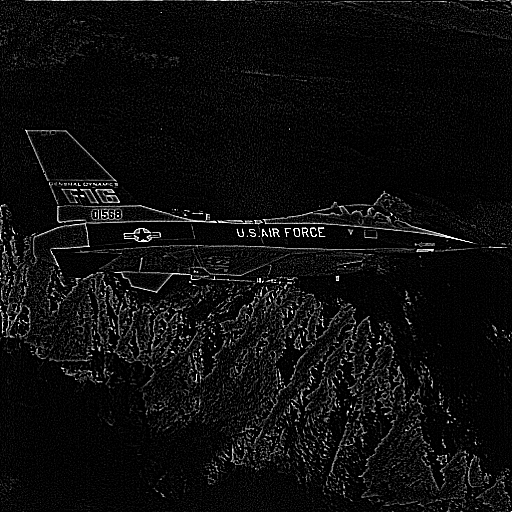

In [30]:
mascara = np.ones((3,3),np.float32)
mascara[1,1]=-8
res = cv2.filter2D(jetplane,-1,mascara)
cv2_imshow(res)

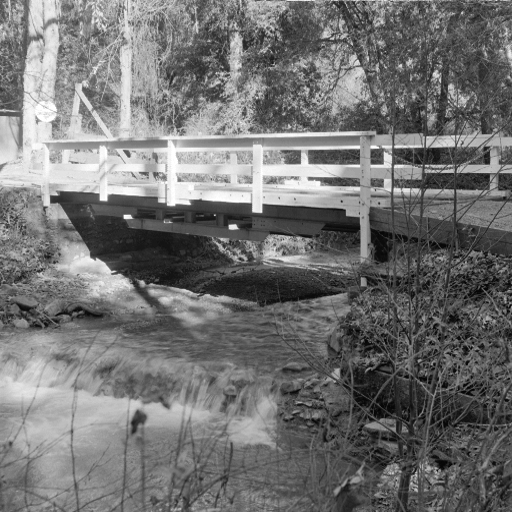

In [31]:
cv2_imshow(walkbridge)

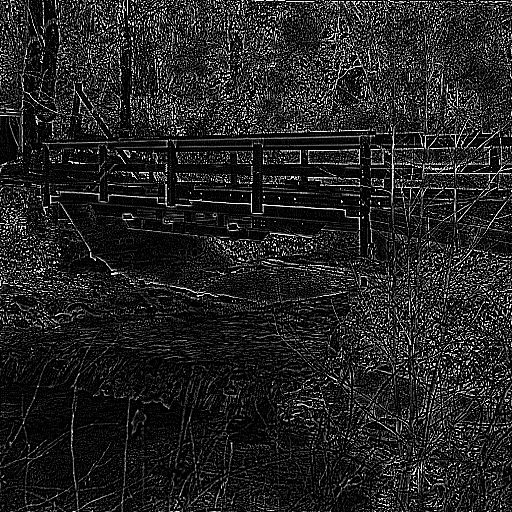

In [32]:
mascara = np.ones((3,3),np.float32)
mascara[1,1]=-8
res = cv2.filter2D(walkbridge,-1,mascara)
cv2_imshow(res)


# In both images, apply the filters for line detection: horizontal, vertical, 45 ° and -45 °. To do this, look for a mask for each filter and use filter2D to apply the filter to the image. Plot the result and explain what happened to the image.

HORIZONTAL FILTER


[[ 1.  1.  1.]
 [-2. -2. -2.]
 [ 1.  1.  1.]]


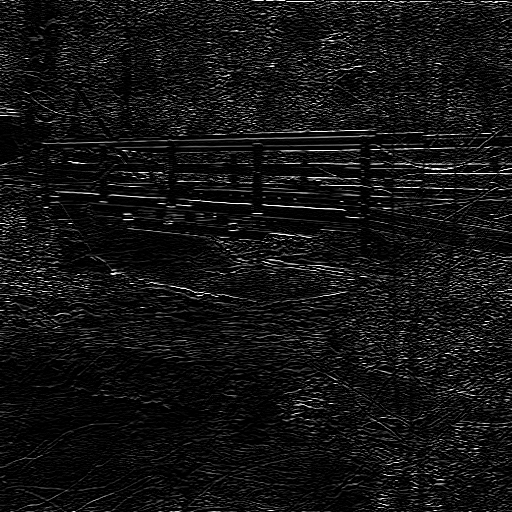

In [47]:
mascara = np.ones((3,3),np.float32)
mascara[1,0]=-2
mascara[1,1]=-2
mascara[1,2]=-2
print(mascara)
res = cv2.filter2D(walkbridge,-1,mascara)
cv2_imshow(res)

[[ 1.  1.  1.]
 [-2. -2. -2.]
 [ 1.  1.  1.]]


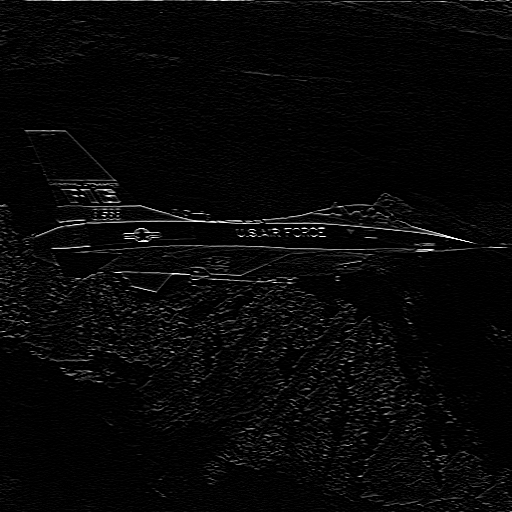

In [48]:
mascara = np.ones((3,3),np.float32)
mascara[1,0]=-2
mascara[1,1]=-2
mascara[1,2]=-2
print(mascara)
res = cv2.filter2D(jetplane,-1,mascara)
cv2_imshow(res)

VERTICAL FILTER

[[ 1. -2.  1.]
 [ 1. -2.  1.]
 [ 1. -2.  1.]]


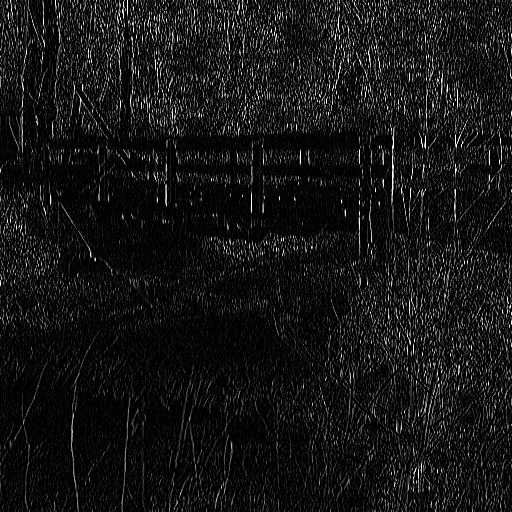

In [52]:
mascara = np.ones((3,3),np.float32)
mascara[0,1]=-2
mascara[1,1]=-2
mascara[2,1]=-2
print(mascara)
res = cv2.filter2D(walkbridge,-1,mascara)
cv2_imshow(res)

[[ 1. -2.  1.]
 [ 1. -2.  1.]
 [ 1. -2.  1.]]


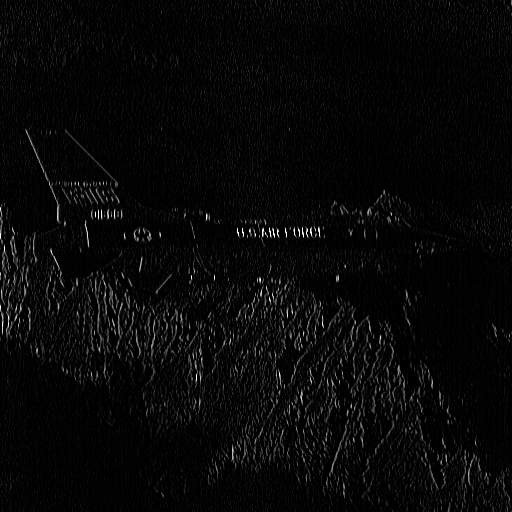

In [53]:
mascara = np.ones((3,3),np.float32)
mascara[0,1]=-2
mascara[1,1]=-2
mascara[2,1]=-2
print(mascara)
res = cv2.filter2D(jetplane,-1,mascara)
cv2_imshow(res)

![alt text](https://drive.google.com/uc?id=1xqD0Ap5c8bp7kYmA4NLKBjkAtBaKa3wj)

FILTER +45º

[[-2.  1.  1.]
 [ 1. -2.  1.]
 [ 1.  1. -2.]]


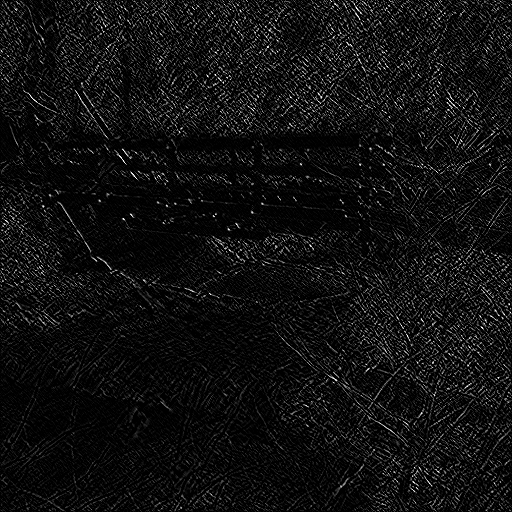

In [55]:
mascara = np.ones((3,3),np.float32)
mascara[0,0]=-2
mascara[1,1]=-2
mascara[2,2]=-2
print(mascara)
res = cv2.filter2D(walkbridge,-1,mascara)
cv2_imshow(res)

[[-2.  1.  1.]
 [ 1. -2.  1.]
 [ 1.  1. -2.]]


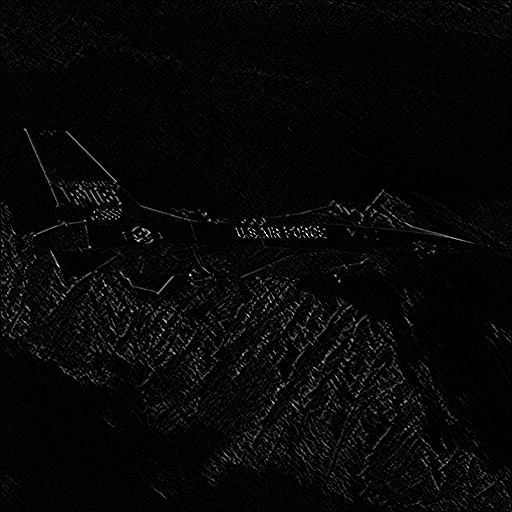

In [56]:
mascara = np.ones((3,3),np.float32)
mascara[0,0]=-2
mascara[1,1]=-2
mascara[2,2]=-2
print(mascara)
res = cv2.filter2D(jetplane,-1,mascara)
cv2_imshow(res)

FILTER -45º

[[ 1.  1. -2.]
 [ 1. -2.  1.]
 [-2.  1.  1.]]


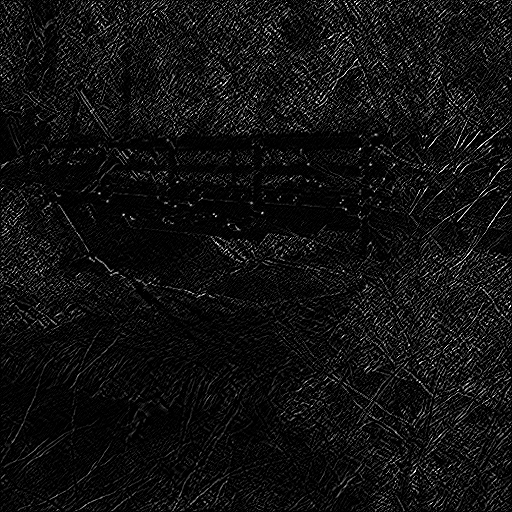

In [57]:
mascara = np.ones((3,3),np.float32)
mascara[0,2]=-2
mascara[1,1]=-2
mascara[2,0]=-2
print(mascara)
res = cv2.filter2D(walkbridge,-1,mascara)
cv2_imshow(res)

[[ 1.  1. -2.]
 [ 1. -2.  1.]
 [-2.  1.  1.]]


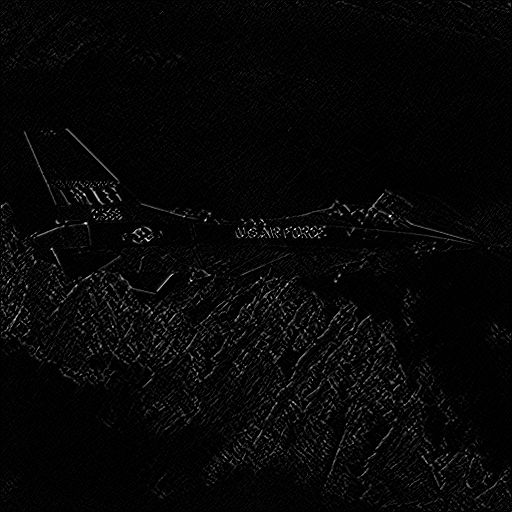

In [58]:
mascara = np.ones((3,3),np.float32)
mascara[0,2]=-2
mascara[1,1]=-2
mascara[2,0]=-2
print(mascara)
res = cv2.filter2D(jetplane,-1,mascara)
cv2_imshow(res)


# Apply the Gaussian noise and salt & pepper to the lake.tif image, apply at least three noise levels, for this change the “noisy” function in the “Spatial Filtration.ipynb” material. Present the results. What is the difference between these noises?

In [78]:
import numpy as np
import os
import cv2
def noisy(noise_typ,image, var):
    if noise_typ == "gauss":
        row,col,ch= image.shape
        mean = 0
        sigma = var**0.5
        gauss = np.random.normal(mean,sigma,(row,col,ch))
        gauss = gauss.reshape(row,col,ch)
        noisy = image + image * gauss * var
        return noisy
    elif noise_typ == "s&p":
        row,col,ch = image.shape
        amount = 0.04
        out = np.copy(image)
        # Salt mode
        num_salt = np.ceil(amount * image.size * var)
        coords = [np.random.randint(0, i - 1, int(num_salt))
              for i in image.shape]
        out[coords] = 1

        # Pepper mode
        num_pepper = np.ceil(amount* image.size * (1. - var))
        coords = [np.random.randint(0, i - 1, int(num_pepper))
              for i in image.shape]
        out[coords] = 0
        return out
    elif noise_typ == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        return noisy
    elif noise_typ =="speckle":
        row,col,ch = image.shape
        gauss = np.random.randn(row,col,ch)
        gauss = gauss.reshape(row,col,ch)        
        noisy = image + image * gauss
        return noisy

In [79]:
lake = cv2.imread('lake.tif')

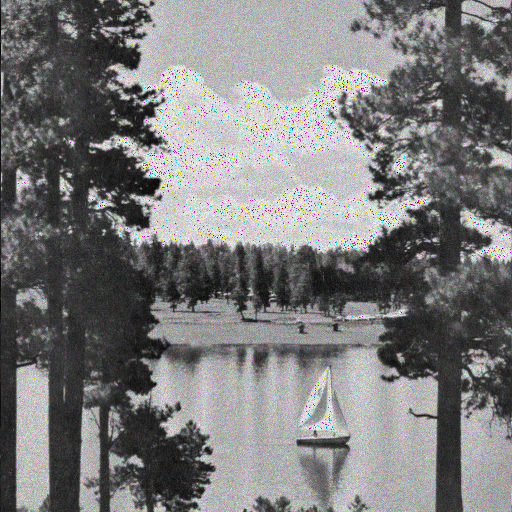

In [91]:
imagemRuido_1 = noisy("gauss",lake,0.2)
imagemRuido_1 = np.array(imagemRuido_1, dtype=np.uint8)
imRuido = cv2.cvtColor(imagemRuido_1, cv2.COLOR_BGR2GRAY)
cv2_imshow(imagemRuido_1)


/home/hardy/anaconda3/envs/ia/lib/python3.6/site-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/home/hardy/anaconda3/envs/ia/lib/python3.6/site-packages/ipykernel_launcher.py:27: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


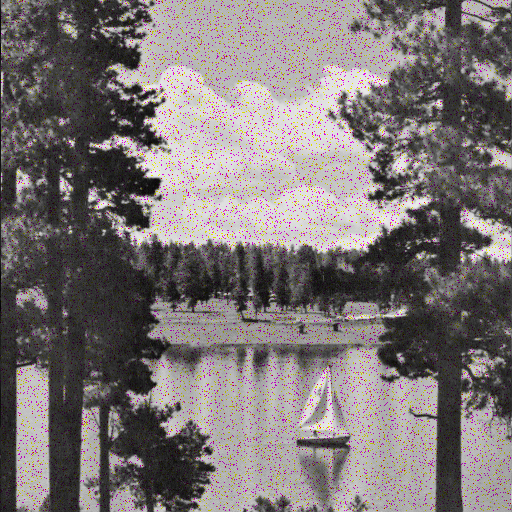

In [92]:
imagemRuido_2 = noisy("s&p",lake,1.0)
imagemRuido_2 = np.array(imagemRuido_2, dtype=np.uint8)
imRuido = cv2.cvtColor(imagemRuido_2, cv2.COLOR_BGR2GRAY)
cv2_imshow(imagemRuido_2)


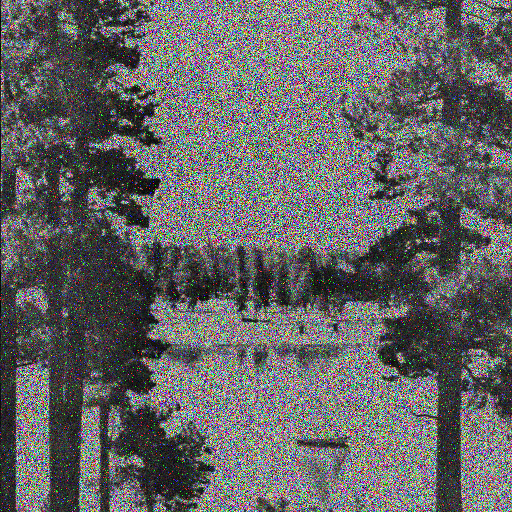

In [93]:
imagemRuido_3 = noisy("gauss",lake,0.6)
imagemRuido_3 = np.array(imagemRuido_3, dtype=np.uint8)
imRuido = cv2.cvtColor(imagemRuido_3, cv2.COLOR_BGR2GRAY)
cv2_imshow(imagemRuido_3)


IN THIS ACTIVITY THE GAUSIAN NOISES AND SALT WERE USED AND PEPPER THE GAUSSIAN NOISE PRESENTS A GREATER LEVEL OF NOISE IN THE PICTURE ALONG THE NOISE SALT AND PEPPER
AS WE CAN OBSERVE THE GAUSSIAN NOISE HAS INSIDENCE OF RED AND GREEN POINTS IN THE PICTURE, THESE POINTS ARE RANDOMLY GENERATED AND ADDED THE ORIGINAL IMAGE MATRIX


# Use Gaussian and bilinear filters to reduce noise from images resulting from exercise 5. Display codes and results. Have the filters been able to reduce noise? What happened to the images?

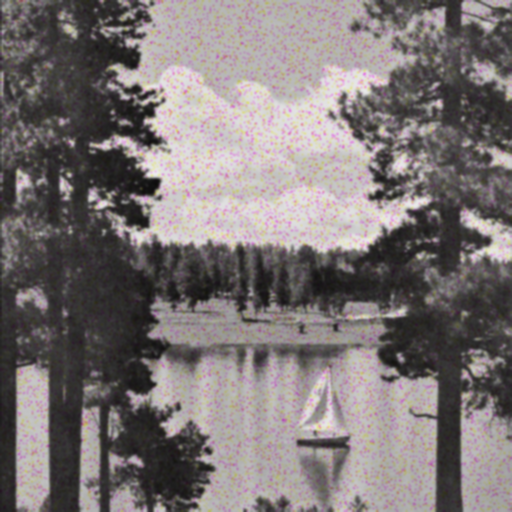

In [102]:
resultado_2 = cv2.GaussianBlur(imagemRuido_2, (5,5), 0)
cv2_imshow(resultado_2)

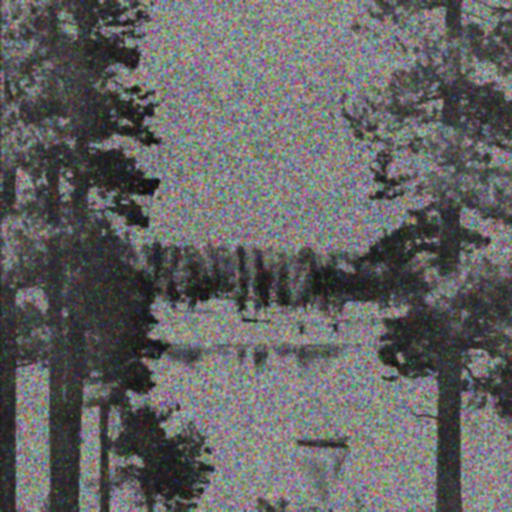

In [94]:
resultado_3 = cv2.GaussianBlur(imagemRuido_3, (5,5), 0)
cv2_imshow(resultado_3)


The Gaussian filter is a low pass filter where it weighs the color values ​​of the image in order to improve the edges and edges of the image, this technique is applied to a matrix declared above 5x5

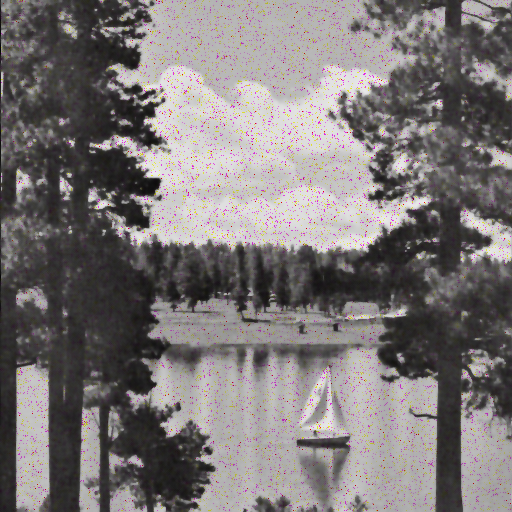

In [107]:
resultado_3 = cv2.bilateralFilter(imagemRuido_2, 5, 100, 100)
cv2_imshow(resultado_3)


The Bilateral filter is an improvement of the Gaussian filter improving the portions and contours of the image the second parameter is the parameter of the mask dimension and only works with odd numbers, the third parameter refers to the sigmacolor where this value acts as a mixture between the color of a pixel with the others around it, the fourth parameter is the range of influence from one pixel to another

# Image Enhancement:


In [89]:
corpo = cv2.imread("corpo.tif")
dolar = cv2.imread("dolar.tif")
onibus_especial = cv2.imread("onibus_espacial.tif")


# On the onibus_espacial.tif image, apply the edge detection filters: Roberts and Prewitt. To do this, look for a mask for each filter and use filter2D to apply the filter to the image. Plot the result and explain what happened to the image.

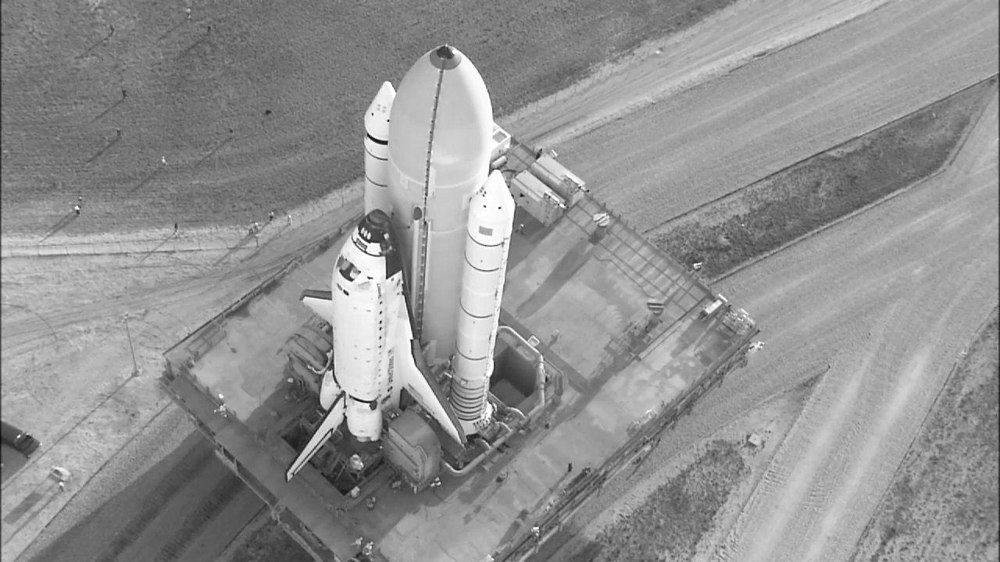

In [121]:
cv2_imshow(onibus_especial)

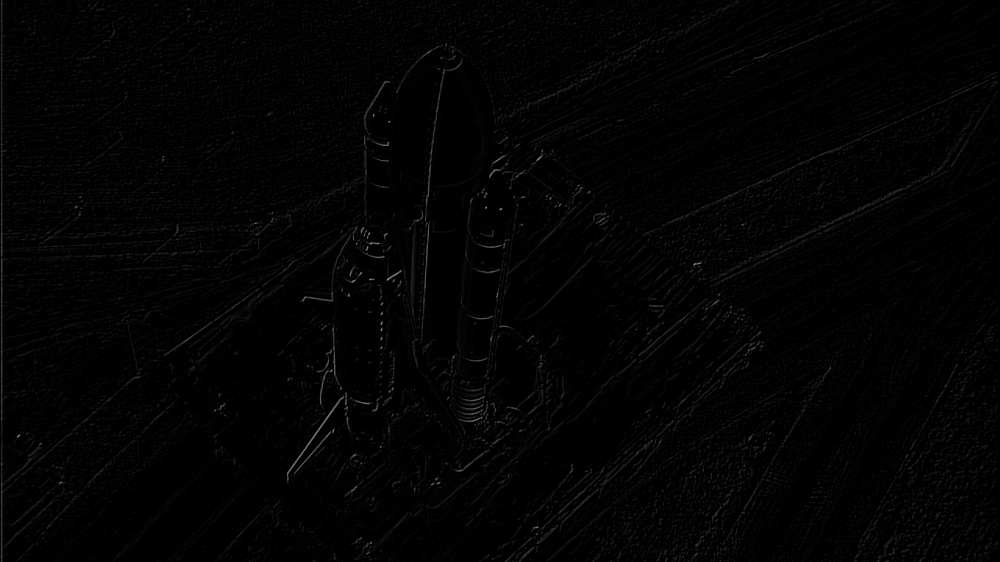

In [116]:
mascara_onibus = np.float32([[-1,0],[0,1]])
res_onibus = cv2.filter2D(onibus_especial, -1, mascara_onibus)
cv2_imshow(res_onibus)


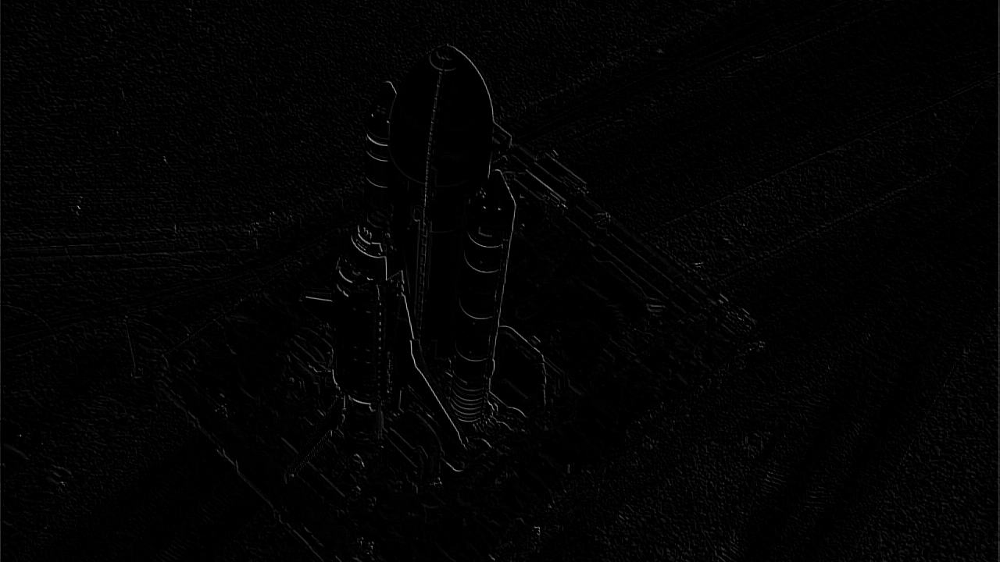

In [118]:
mascara_onibus = np.float32([[0,-1],[1,0]])
res_onibus = cv2.filter2D(onibus_especial, -1, mascara_onibus)
cv2_imshow(res_onibus)


ABOVE THE TWO ROBERT DETECTORS WERE USED WHERE THESE ARE A MASK THAT IS APPLIED TO THE IMAGE USING THE OPENCV FILTER2D METHOD

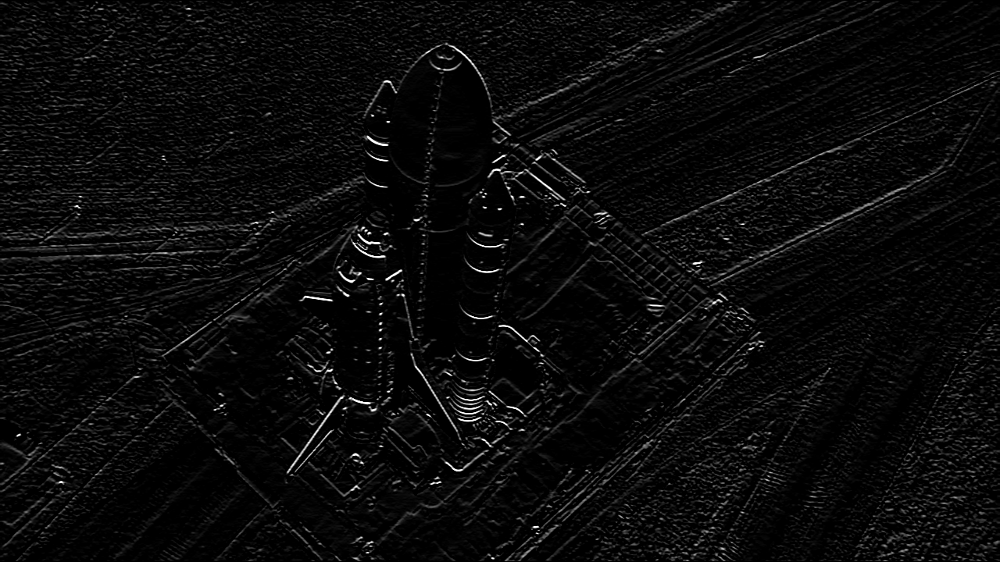

In [120]:
mascara_onibus = np.float32([[-1,-1,-1],[0,0,0],[1,1,1]])
res_onibus = cv2.filter2D(onibus_especial, -1, mascara_onibus)
cv2_imshow(res_onibus)

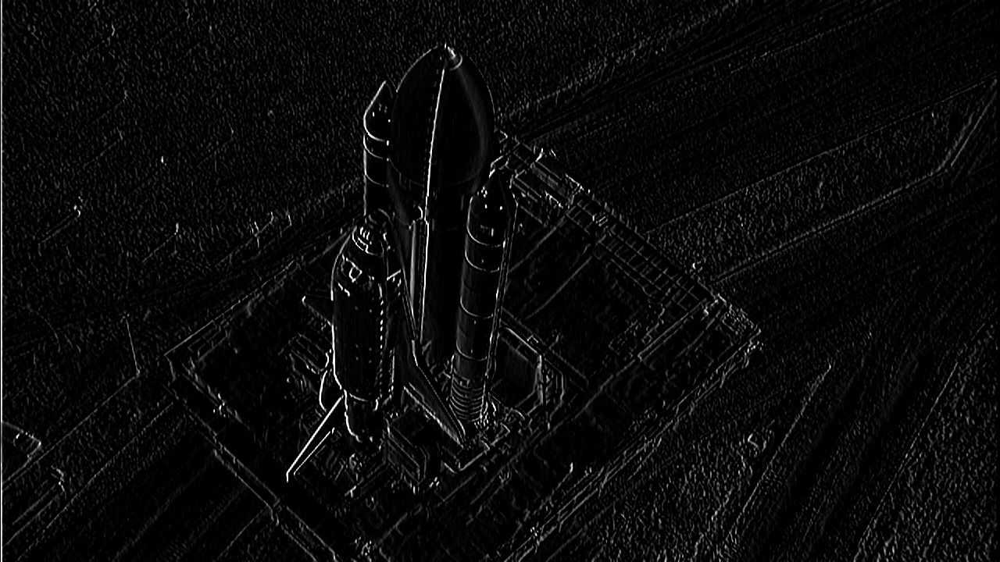

In [122]:
mascara_onibus = np.float32([[-1,0,1],[-1,0,1],[-1,0,1]])
res_onibus = cv2.filter2D(onibus_especial, -1, mascara_onibus)
cv2_imshow(res_onibus)


ABOVE THE PREWITT MASK WAS USED WHERE THESE IMPROVEMENTS IN THE EDGE ENHANCEMENT BY USING DERIVATIVES, THIS DERIVATIVE IS USED TO FIND THE POINTS AND LINES CONTAINED IN THE IMAGE


# In the dolar.tif image apply the sobel (horizontal and vertical) and Laplacian filters, show the code and the result of the image. What happened to the resulting image? Explain and relate these results to those obtained in exercise 9. What could be done to improve the quality of detection?

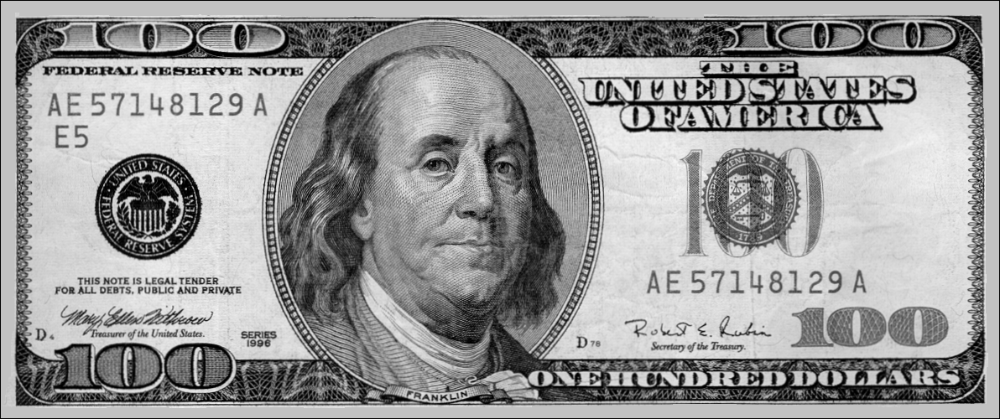

In [124]:
cv2_imshow(dolar)

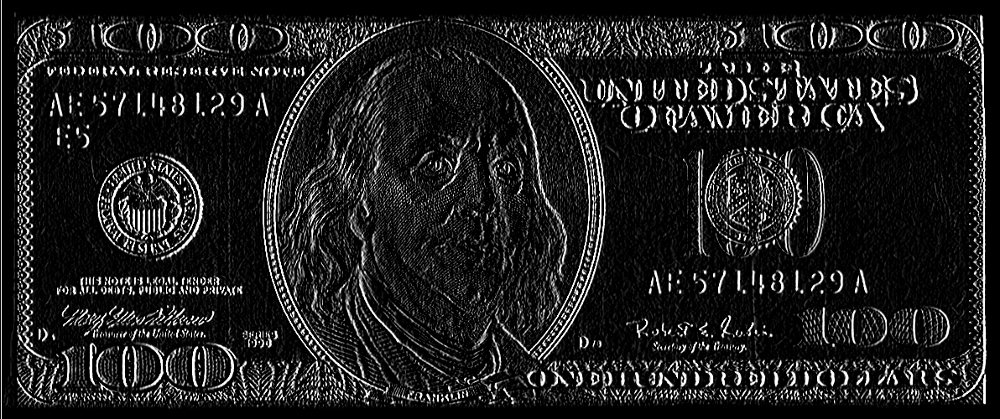

In [140]:
res_dolar_x = cv2.Sobel(dolar, cv2.CV_8U, 1, 0, ksize=3)
cv2_imshow(res_dolar_x)

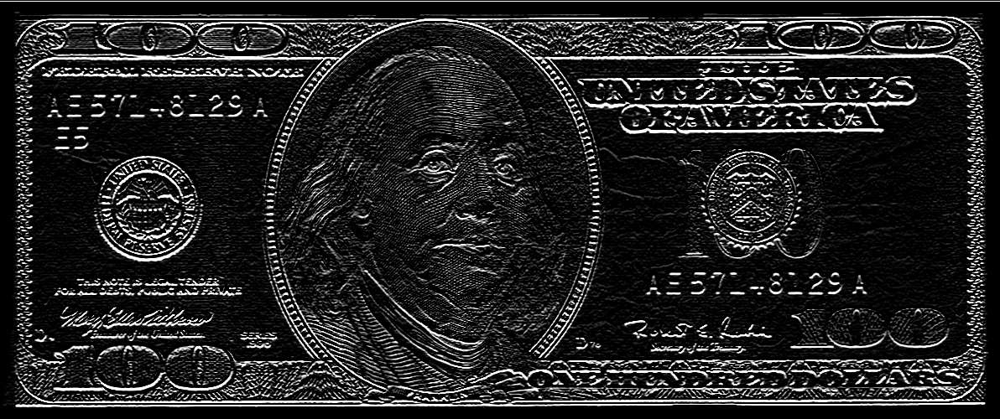

In [139]:
res_dolar_y = cv2.Sobel(dolar, cv2.CV_8U, 0, 1, ksize=3)
cv2_imshow(res_dolar_y)

ABOVE WE USE THE SOBEL FILTER WHERE THIS IDENTIFIES THE RIMS CONTAINED IN THE IMAGE AND ENHANCES THESE RIMS BY INCREASING THE WIDTH OF THE SAME, THE SECOND PARAMETER REFERRES TO THE FORMATION OF THE DATA IN THIS IMAGE, THIRD PARAMETER IS IN DEMONSTRATION IN THEME THEME THERE 0 AND 1 BEING 1 ON AND 0 OFF


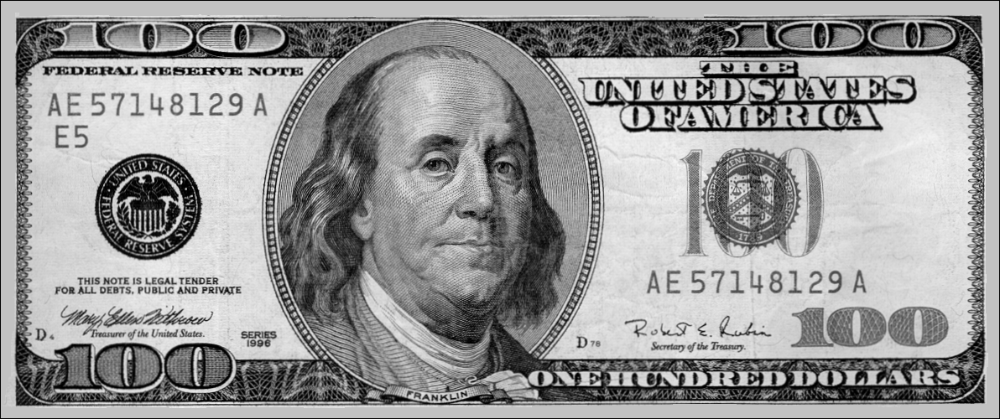

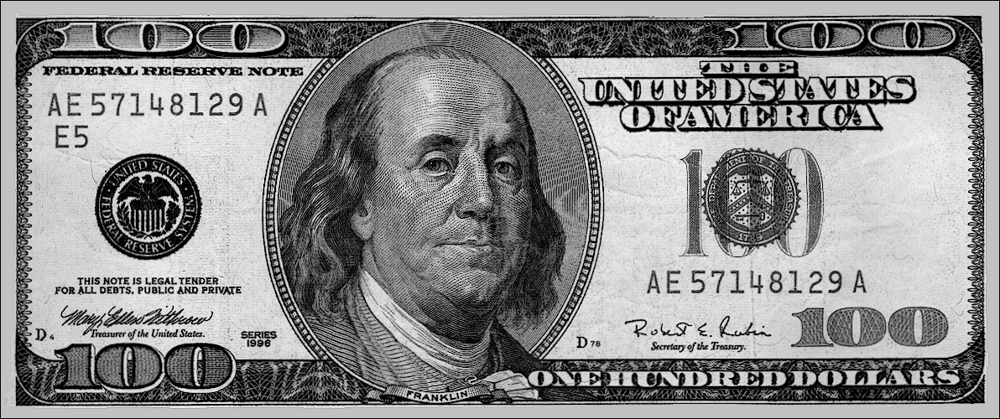

In [155]:
res_dolar_la = cv2.Laplacian(dolar, cv2.CV_8U)

res = cv2.subtract(dolar, res_dolar_la)
cv2_imshow(dolar)
cv2_imshow(res)

USING THIS FILTER WE GET A BETTER LEVEL OF SHARPNESS IN THE PHOTO


IN THE NINE EXERCISE TWO FILTERS WERE USED Roberts and Prewitt, THE ROBERTS FILTER WAS VERY BAD PERFORMANCE IF COMPARED TO OTHERS, BECAUSE THIS FILTER USES ONLY ONE 2X2 MATRIX AS MASKS, OR THERE IS LITTLE INFORMATION THAT WILL BE LITTLE OF INFORMATION THAT WILL BE LITTLE OF INFORMATION THERE IS AN IMPROVEMENT BECAUSE THIS WILL HAVE A 3 DIMENSION FILTER CONTAINING 3 POSSIBILITY 0, 1, -1 THE SOBEL FILTER HAS AN IMPROVEMENT BECAUSE IT ALSO USES A 3X3 MATRIX BUT WITH 4 POSSIBILITIES 0, 1, -1, 2


ON THE LAPLACIAN FILTER WE USE THIS TO LEAVE THE FAREST IMAGE BY MAKING A SUBTRACTION OPERATION BETWEEN THE IMAGE AND THE EDGE OF THE IMAGE CAPTURED BY THE FILTER
